In [127]:
import cv2
import numpy as np  
import matplotlib.pyplot as plt

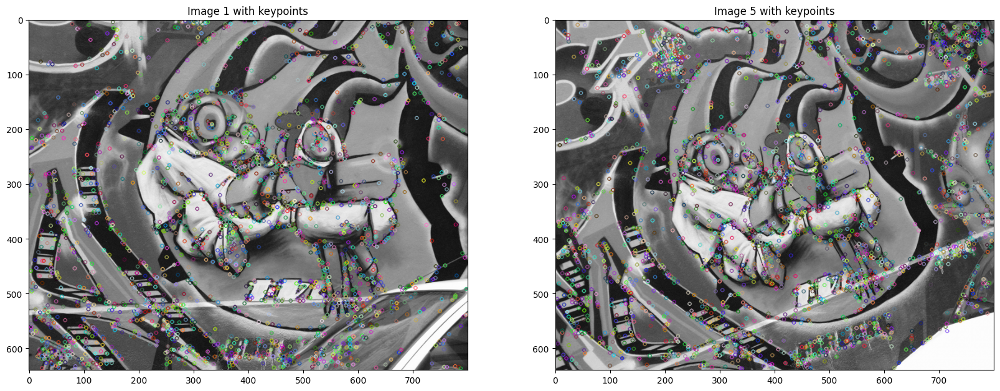

In [128]:
# Load Images
img1 = cv2.imread('images/img1.ppm')
img5 = cv2.imread('images/img2.ppm')

# Convert to Grayscale
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray5 = cv2.cvtColor(img5, cv2.COLOR_BGR2GRAY)

# Initiate SIFT detector
sift = cv2.SIFT_create()

# Find the keypoints and descriptors with SIFT
keypoints1, descriptors1 = sift.detectAndCompute(gray1, None)
keypoints5, descriptors5 = sift.detectAndCompute(gray5, None)

# Draw keypoints
img1_with_keypoints = cv2.drawKeypoints(gray1, keypoints1, img1)
img5_with_keypoints = cv2.drawKeypoints(gray5, keypoints5, img5)

# Show Images
#cv2.imshow('Image 1 Keypoints', img1_with_keypoints)
#cv2.imshow('Image 5 Keypoints', img5_with_keypoints)
#cv2.waitKey(0)
#cv2.destroyAllWindows()

# Show Images
plt.figure(figsize=(20, 20))

plt.subplot(1, 2, 1)
plt.imshow(img1_with_keypoints)
plt.title('Image 1 with keypoints')

plt.subplot(1, 2, 2)
plt.imshow(img5_with_keypoints)
plt.title('Image 5 with keypoints')

plt.show()



In [129]:
# Import images
img1 = cv2.imread('images/img1.ppm')  
img2 = cv2.imread('images/img2.ppm')  
img3 = cv2.imread('images/img3.ppm')  
img4 = cv2.imread('images/img4.ppm')  
img5 = cv2.imread('images/img5.ppm')

In [130]:
import cv2 as cv
import matplotlib.pyplot as plt

In [131]:
def sift_match(im1, im2):
    
    GOOD_MATCH_PERCENT = 0.85

    # Detect sift features
    sift = cv.SIFT_create()
    keypoint_1, descriptors_1 = sift.detectAndCompute(im1,None)
    keypoint_2, descriptors_2 = sift.detectAndCompute(im2,None)

    # Match features.
    matcher = cv.BFMatcher()
    matches = matcher.knnMatch(descriptors_1, descriptors_2, k = 2) 

    # Filter good matches using ratio test in Lowe's paper
    good_matches = []

    for a,b in matches:
        if a.distance < GOOD_MATCH_PERCENT*b.distance:
            good_matches.append(a)

    # Extract location of good matches
    points1 = np.zeros((len(good_matches), 2), dtype=np.float32)
    points2 = np.zeros((len(good_matches), 2), dtype=np.float32)

    for i, match in enumerate(good_matches):
        points1[i, :] = keypoint_1[match.queryIdx].pt
        points2[i, :] = keypoint_2[match.trainIdx].pt

    # Plot the matching
    fig, ax = plt.subplots(figsize = (15,15))
    ax.axis('off')
    matched_img = cv.drawMatches(im1, keypoint_1, im2, keypoint_2, good_matches, im2, flags = 2)
    plt.imshow(cv.cvtColor(matched_img,cv.COLOR_BGR2RGB))
    plt.show()

    result = np.concatenate((points1,points2), axis = 1)

    return result

In [132]:
def calculateHomography(correspondences):
    temp_list = []
    for points in correspondences:
        p1 = np.matrix([points.item(0), points.item(1), 1]) # (x1,y1)
        p2 = np.matrix([points.item(2), points.item(3), 1]) # (x2,y2)

        a2 = [0, 0, 0, -p2.item(2) * p1.item(0), -p2.item(2) * p1.item(1), -p2.item(2) * p1.item(2),
              p2.item(1) * p1.item(0), p2.item(1) * p1.item(1), p2.item(1) * p1.item(2)]
        a1 = [-p2.item(2) * p1.item(0), -p2.item(2) * p1.item(1), -p2.item(2) * p1.item(2), 0, 0, 0,
              p2.item(0) * p1.item(0), p2.item(0) * p1.item(1), p2.item(0) * p1.item(2)]
        temp_list.append(a1)
        temp_list.append(a2)

    assemble_matrix = np.matrix(temp_list)

    #svd composition
    u, s, v = np.linalg.svd(assemble_matrix)

    #reshape the min singular value into a 3 by 3 matrix
    h = np.reshape(v[8], (3, 3))

    #normalize 
    h = (1/h.item(8)) * h
    return h

In [133]:
import random
def loss(matched_points, h):
    point1 = np.transpose(np.matrix([matched_points[0].item(0), matched_points[0].item(1), 1]))
    point2 = np.transpose(np.matrix([matched_points[0].item(2), matched_points[0].item(3), 1]))
    
    # Estimate the point after applying the homography
    transformed_point2 = np.dot(h, point1)
    transformed_point2 = (1/transformed_point2.item(2))*transformed_point2

    # Calculate the error between the actual and estimated point
    error = point2 - transformed_point2
    
    return np.linalg.norm(error)

def random_sample(data_list):
    """
    Returns a list of 3 random samples from a given list
    """
    sample_list = []
    random.seed(0)
    rand_nums = random.sample(range(1, len(data_list)), 3)
    for i in rand_nums:
        sample_list.append(data_list[i])
    return np.array(sample_list)

def ransac(matched_points):
    maxInliers = 0
    best_H = None
    for i in range(10):
        random_points = random_sample(matched_points)

        # Generate the homography 
        homography = calculateHomography(random_points)
        num_inliers = 0

        # Find the inliers
        for i in range(len(matched_points)):
            d = loss(matched_points[i], homography)
            if d < 3:
                num_inliers += 1

        if num_inliers > maxInliers:
            maxInliers = num_inliers
            best_H = homography
    
    return best_H

In [134]:
def homography_reshape(homography):
    homography_ = np.array(homography)
    homography_ = homography_.reshape(3,3)
    homography_ = homography_/(homography_[-1][-1])
    return homography_

In [135]:
def plot_warped(im1, im2, h):
    width = im1.shape[1] + im2.shape[1]
    height = im1.shape[0] + im2.shape[0]
    result = cv.warpPerspective(im1, h, (width, height))
    result[0:im2.shape[0], 0:im2.shape[1]] = im2
    fig, ax = plt.subplots(1,1,figsize= (8,8))
    ax.imshow(cv.cvtColor(result,cv.COLOR_BGR2RGB))

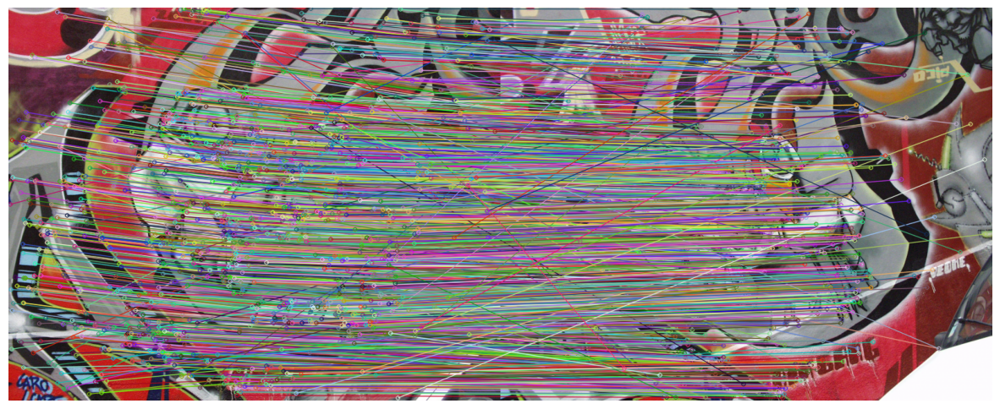

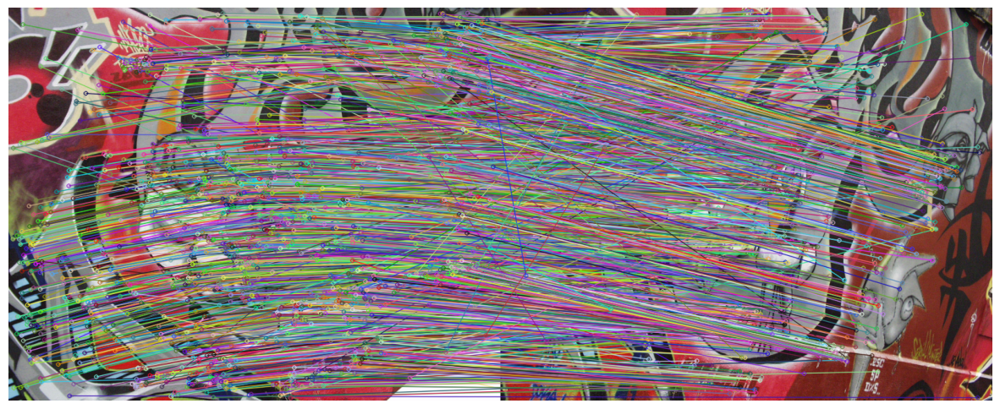

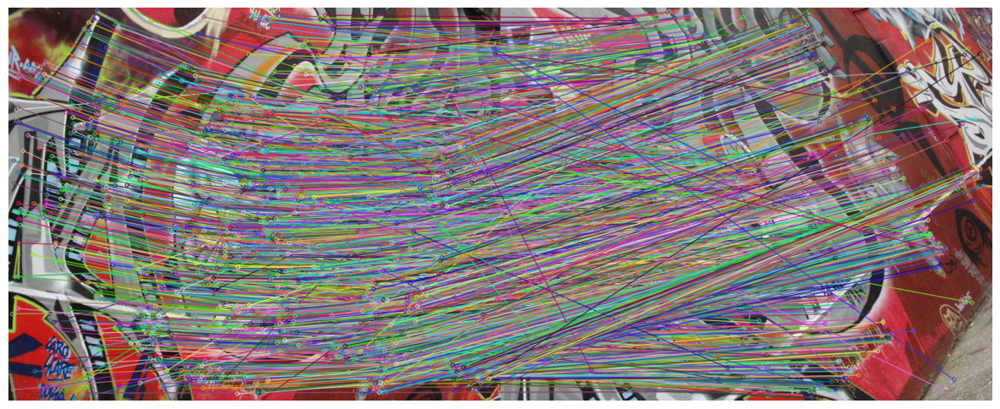

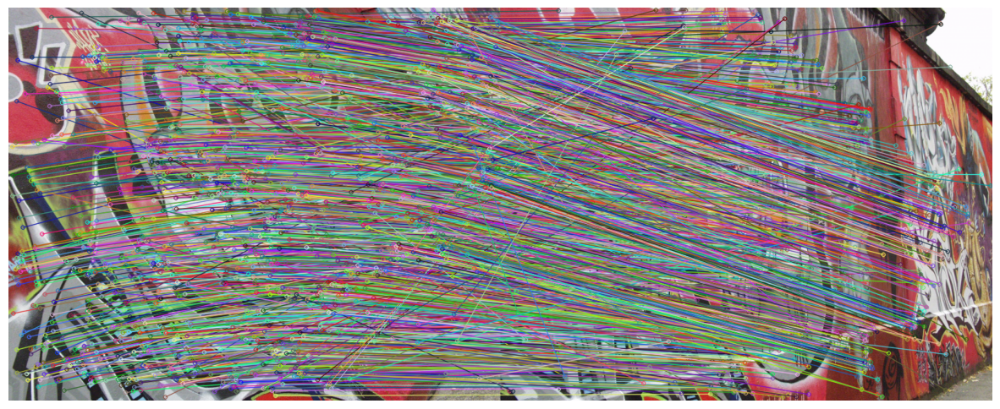

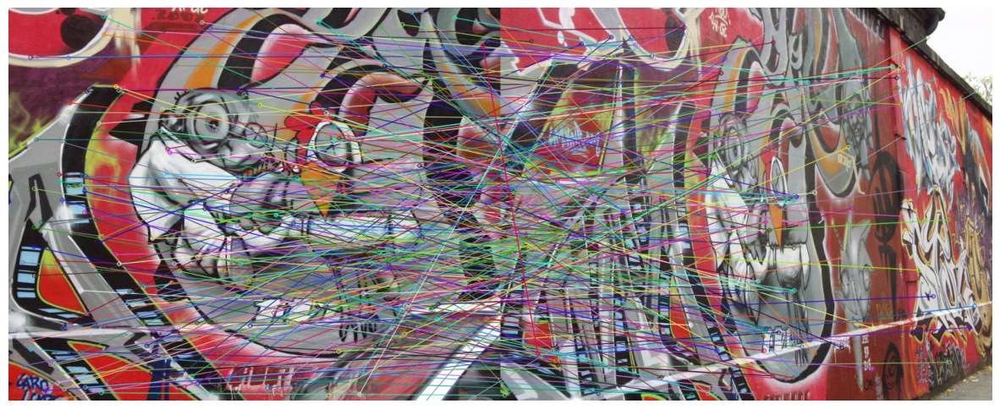

[[ 6.61941435e-01 -1.28255150e+00  2.49580598e+02]
 [ 1.53694792e+00 -3.07414189e+00  5.89321136e+02]
 [ 2.69131684e-03 -5.47870080e-03  1.00000000e+00]]


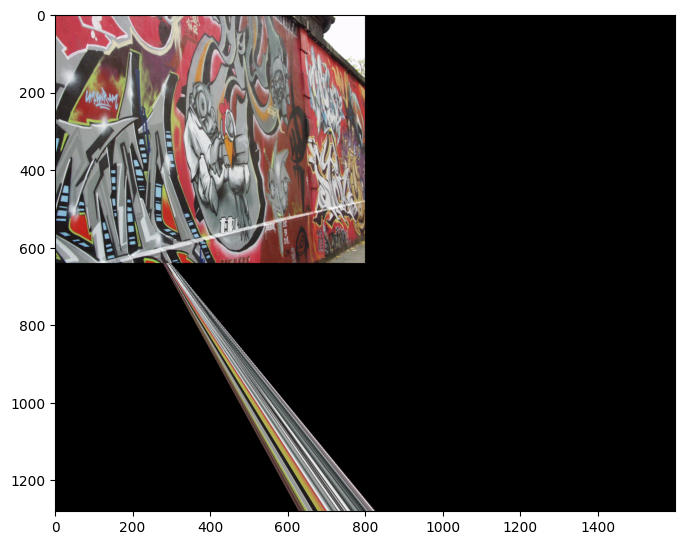

In [136]:
match1_2 = sift_match(img1,img2)
match2_3 = sift_match(img2,img3)
match3_4 = sift_match(img3,img4)
match4_5 = sift_match(img4,img5)
match1_5 = sift_match(img1,img5)

# Generate Correspondence Matrices
correspondenceMatrix1_2 = np.matrix(match1_2)
correspondenceMatrix2_3 = np.matrix(match2_3)
correspondenceMatrix3_4 = np.matrix(match3_4)
correspondenceMatrix4_5 = np.matrix(match4_5)

# Run ransac algorithm
H1_2 = ransac(correspondenceMatrix1_2)
H2_3 = ransac(correspondenceMatrix2_3)
H3_4 = ransac(correspondenceMatrix3_4)
H4_5 = ransac(correspondenceMatrix4_5)

# Reshaping the homography to the matric format
H1_2 = homography_reshape(H1_2)
H2_3 = homography_reshape(H2_3)
H3_4 = homography_reshape(H3_4)
H4_5 = homography_reshape(H4_5)

H1_5 = H4_5@H3_4@H2_3@H1_2
H1_5 = homography_reshape(H1_5)
print(H1_5)

plot_warped(img1,img5,H1_5)

NameError: name 'calculated_H' is not defined

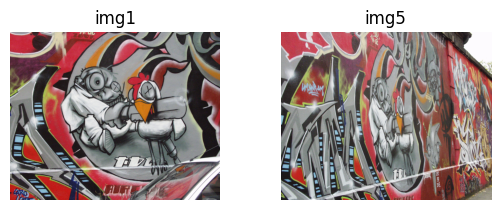

In [137]:
img1 = cv.imread('images/img1.ppm')
img5 = cv.imread('images/img5.ppm')
plt.subplot(2,2,1)
plt.imshow(cv.cvtColor(img1, cv.COLOR_BGR2RGB))
plt.title('img1')
plt.axis('off')

plt.subplot(2,2,2)
plt.imshow(cv.cvtColor(img5, cv.COLOR_BGR2RGB))
plt.title('img5')
plt.axis('off')

image_perspective = cv.warpPerspective(img1, calculated_H, (img5.shape[1], img5.shape[0]))
plt.subplot(2,2,3)
plt.imshow(cv.cvtColor(image_perspective, cv.COLOR_BGR2RGB))
plt.title('persceptive image')
plt.axis('off')

threshold, mask = cv.threshold(cv.cvtColor(image_perspective, cv.COLOR_BGR2GRAY), 1, 255, cv.THRESH_BINARY)
mask_inv = cv.bitwise_not(mask)
img5_bg = cv.bitwise_and(img5, img5, mask=mask_inv)
dst = cv.addWeighted(img5_bg, 1, image_perspective, 1, 0)

plt.subplot(2,2,4)
plt.imshow(cv.cvtColor(dst, cv.COLOR_BGR2RGB)) 
plt.title('blended image')
plt.axis('off') 
